<a href="https://colab.research.google.com/github/ark0723/tb_project/blob/main/tb/yolo_output/train.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Mount Google Deive

In [ ]:
from google.colab import drive
# Mount the Google Drive at /content/drive
drive.mount('/content/drive')

# Verify by listing the files in the drive
!ls /content/drive/My\ Drive/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
TB_python  yolo_train  운동영상


# Dataset Preprocessing
- padding
- split into train, val, and test sets

In [ ]:
from sklearn.model_selection import train_test_split
import os
import shutil
import cv2

# for progress bars (optional, but useful for large datasets)
from tqdm import tqdm


class DataLoader:
    def __init__(
        self,
        image_dir,
        label_dir,
        output_dir,
        augmentations=None,
        test_size=0.2,
        val_size=0.2,
        random_state=42,
    ):
        self.image_dir = image_dir
        self.label_dir = label_dir
        self.output_dir = output_dir
        self.test_size = test_size
        self.val_size = val_size
        self.random_state = random_state

        self.augmentor = augmentations

        self.image_paths = [
            os.path.join(image_dir, f)
            for f in os.listdir(image_dir)
            if f.endswith(".png")
        ]
        self.label_paths = [
            os.path.join(label_dir, f.replace(".png", ".txt"))
            for f in os.listdir(image_dir)
            if f.endswith(".png")
        ]

    def image_label_generator(self, images, labels):
        for img, lbl in zip(images, labels):
            yield img, lbl

    def pad_to_square(self, image, bboxes, orig_width, orig_height, max_dim):
        """Pads the image to square and adjusts bounding boxes."""
        # Calculate padding for width and height
        pad_top = (max_dim - orig_height) // 2
        pad_bottom = max_dim - orig_height - pad_top
        pad_left = (max_dim - orig_width) // 2
        pad_right = max_dim - orig_width - pad_left

        # Apply padding to image
        padded_image = cv2.copyMakeBorder(
            image,
            pad_top,
            pad_bottom,
            pad_left,
            pad_right,
            cv2.BORDER_CONSTANT,
            value=[0, 0, 0],
        )

        # Adjust bounding boxes
        for bbox in bboxes:
            bbox[0] = (bbox[0] * orig_width + pad_left) / max_dim  # x_center
            bbox[1] = (bbox[1] * orig_height + pad_top) / max_dim  # y_center
            bbox[2] = (bbox[2] * orig_width) / max_dim  # width
            bbox[3] = (bbox[3] * orig_height) / max_dim  # height

        return padded_image, bboxes

    def pad_and_save_image_label(
        self, image_path, label_path, output_image_path, output_label_path
    ):
        """Pads the image to a square shape, adjusts the label, and saves both."""
        # Load image and label data
        image = cv2.imread(image_path)
        orig_height, orig_width = image.shape[:2]
        bboxes, class_labels = self.read_yolo_label(label_path)

        # Calculate the max dimension (for square padding)
        max_dim = max(orig_height, orig_width)

        # Pad the image and adjust bounding boxes
        padded_image, bboxes = self.pad_to_square(
            image, bboxes, orig_width, orig_height, max_dim
        )

        # Save padded image
        cv2.imwrite(output_image_path, padded_image)

        # Save adjusted labels
        self.save_yolo_labels(output_label_path, bboxes, class_labels)

    def pad_dataset(self):
        """Pads the dataset images and saves them without redundancy."""
        padded_image_dir = os.path.join(self.output_dir, "padded_images/")
        padded_label_dir = os.path.join(self.output_dir, "padded_labels/")
        os.makedirs(padded_image_dir, exist_ok=True)
        os.makedirs(padded_label_dir, exist_ok=True)

        for img_path, lbl_path in tqdm(
            self.image_label_generator(self.image_paths, self.label_paths),
            desc="Padding images",
        ):
            output_image_path = os.path.join(
                padded_image_dir, os.path.basename(img_path)
            )
            output_label_path = os.path.join(
                padded_label_dir, os.path.basename(lbl_path)
            )
            self.pad_and_save_image_label(
                img_path, lbl_path, output_image_path, output_label_path
            )

        # Update the image and label paths to the new padded ones
        self.image_paths = [
            os.path.join(padded_image_dir, f)
            for f in os.listdir(padded_image_dir)
            if f.endswith(".png")
        ]
        self.label_paths = [
            os.path.join(padded_label_dir, f.replace(".png", ".txt"))
            for f in os.listdir(padded_image_dir)
            if f.endswith(".png")
        ]

    def split_dataset(self):
        """Splits the dataset into training, validation, and test sets."""
        # First split into train+val and test sets
        train_images, test_images, train_labels, test_labels = train_test_split(
            self.image_paths,
            self.label_paths,
            test_size=self.test_size,
            random_state=self.random_state,
        )
        # Further split the train set into train and validation sets
        train_images, val_images, train_labels, val_labels = train_test_split(
            train_images,
            train_labels,
            test_size=self.val_size,
            random_state=self.random_state,
        )
        return (
            train_images,
            val_images,
            test_images,
            train_labels,
            val_labels,
            test_labels,
        )

    def copy_images_and_labels(self, images, labels, split):
        """Copies the images and labels to the corresponding directories."""
        img_dst_dir = os.path.join(self.output_dir, f"images/{split}/")
        lbl_dst_dir = os.path.join(self.output_dir, f"labels/{split}/")
        os.makedirs(img_dst_dir, exist_ok=True)
        os.makedirs(lbl_dst_dir, exist_ok=True)

        for img_path, lbl_path in self.image_label_generator(images, labels):
            shutil.copy2(img_path, img_dst_dir)
            shutil.copy2(lbl_path, lbl_dst_dir)

    def read_yolo_label(self, label_path):
        """Reads YOLO label and returns bounding boxes and class labels."""
        bboxes = []
        class_labels = []
        with open(label_path, "r") as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(
                    float, line.strip().split()
                )
                bboxes.append([x_center, y_center, width, height])
                class_labels.append(int(class_id))
        return bboxes, class_labels

    def save_yolo_labels(self, label_path, bboxes, class_labels):
        """Saves the augmented YOLO labels."""
        with open(label_path, "w") as f:
            for bbox, class_id in zip(bboxes, class_labels):
                bbox = [str(x) for x in bbox]
                line = f"{class_id} " + " ".join(bbox) + "\n"
                f.write(line)

    def augment_image_and_label(
        self, image_path, label_path, output_image_path, output_label_path
    ):
        """Augments image and corresponding labels."""
        image = cv2.imread(image_path)

        # Read yolo label (bounding boxes in YOLO format)
        bboxes, class_labels = self.read_yolo_label(label_path)

        # perform augmentation
        augmented = self.augmentor(
            image=image, bboxes=bboxes, class_labels=class_labels
        )

        # save augmented image nad labels
        cv2.imwrite(output_image_path, augmented["image"])
        self.save_yolo_labels(
            output_label_path, augmented["bboxes"], augmented["class_labels"]
        )

    def augment_dataset(self, train_images, train_labels):
        """Applies augmentation to the training dataset and saves results."""
        augmented_image_dir = os.path.join(self.output_dir, "images/train_augmented/")
        augmented_label_dir = os.path.join(self.output_dir, "labels/train_augmented/")
        os.makedirs(augmented_image_dir, exist_ok=True)
        os.makedirs(augmented_label_dir, exist_ok=True)

        for img_path, lbl_path in self.image_label_generator(
            train_images, train_labels
        ):
            augmented_img_path = os.path.join(
                augmented_image_dir, os.path.basename(img_path)
            )
            augmented_lbl_path = os.path.join(
                augmented_label_dir, os.path.basename(lbl_path)
            )
            self.augment_image_and_label(
                img_path, lbl_path, augmented_img_path, augmented_lbl_path
            )

    def __call__(self):
        # pad all images and labels
        self.pad_dataset()

        # split dataset
        train_images, val_images, test_images, train_labels, val_labels, test_labels = (
            self.split_dataset()
        )

        # Create directories for saving results
        for split in ["train", "val", "test"]:
            os.makedirs(os.path.join(self.output_dir, f"images/{split}"), exist_ok=True)
            os.makedirs(os.path.join(self.output_dir, f"labels/{split}"), exist_ok=True)

        # Copy training and validation images and labels
        self.copy_images_and_labels(train_images, train_labels, split="train")
        self.copy_images_and_labels(val_images, val_labels, split="val")
        self.copy_images_and_labels(test_images, test_labels, split="test")

        # Augment training data
        if self.augmentor is not None:
            self.augment_dataset(train_images, train_labels)

In [ ]:
import albumentations as A

image_dir = "/content/drive/MyDrive/yolo_train/dataset/images"
label_dir = "/content/drive/MyDrive/yolo_train/dataset/labels"
output_dir = "/content/drive/MyDrive/yolo_train/dataset"

augmentations = A.Compose(
    [
        A.RandomCrop(width=3300, height=3300),
        A.RandomBrightnessContrast(p=0.2),
        A.GaussianBlur(p=0.3),
    ],
    bbox_params=A.BboxParams(format="yolo", label_fields=["class_labels"]),
)

# prepare augmented dataset for YOLO11n
DataLoader(
    image_dir=image_dir,
    label_dir=label_dir,
    output_dir=output_dir,
    augmentations=augmentations,
)()

Padding images: 191it [01:56,  1.64it/s]


# Install libraries for YOLO training

In [ ]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.12 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 36.6/112.6 GB disk)


In [ ]:
#@title Select YOLO11 🚀 logger {run: 'auto'}
logger = 'Comet' #@param ['Comet', 'TensorBoard']

if logger == 'Comet':
  %pip install -q comet_ml
  import comet_ml; comet_ml.init()
elif logger == 'TensorBoard':
  %load_ext tensorboard
  %tensorboard --logdir .

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.5/101.5 kB 10.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 694.9/694.9 kB 25.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 979.1/979.1 kB 35.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 43.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.8/313.8 kB 21.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.9/137.9 kB 10.7 MB/s eta 0:00:00


COMET WARNING: comet_ml.init() is deprecated and will be removed soon. Please use comet_ml.login()


# Train YOLO

In [5]:
from ultralytics import YOLO

# load pre-trained model
model = YOLO("yolo11n.pt")

# train the model
results = model.train(data="/content/drive/MyDrive/yolo_train/dataset/augmented_data.yaml", epochs = 100, batch = 16, imgsz = 640, verbose = True)

100%|██████████| 5.35M/5.35M [00:00<00:00, 352MB/s]


Ultralytics 8.3.12 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/drive/MyDrive/yolo_train/dataset/augmented_data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_lab

100%|██████████| 755k/755k [00:00<00:00, 83.3MB/s]


Overriding model.yaml nc=80 with nc=45

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytic

COMET WARNING: To get all data logged automatically, import comet_ml before the following modules: torch, sklearn.
COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Experiment is live on comet.com https://www.comet.com/ark0723/general/3898990be07d45c886f02f9320a3a042

COMET INFO: Couldn't find a Git repository in '/content' nor in any parent directory. Set `COMET_GIT_DIRECTORY` if your Git Repository is elsewhere.


TensorBoard: Start with 'tensorboard --logdir runs/detect/train', view at http://localhost:6006/
Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLO11n...
AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/yolo_train/dataset/labels/train_augmented... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [01:58<00:00,  1.03it/s]

train: New cache created: /content/drive/MyDrive/yolo_train/dataset/labels/train_augmented.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.18 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/drive/MyDrive/yolo_train/dataset/labels/val... 31 images, 0 backgrounds, 0 corrupt: 100%|██████████| 31/31 [01:10<00:00,  2.26s/it]

val: New cache created: /content/drive/MyDrive/yolo_train/dataset/labels/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000204, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.78G      3.241      5.548      1.826        158        640: 100%|██████████| 8/8 [00:17<00:00,  2.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

                   all         31        498          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.82G      2.765      5.433      1.583        140        640: 100%|██████████| 8/8 [00:10<00:00,  1.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.85it/s]

                   all         31        498          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.66G      1.986      5.255      1.268        226        640: 100%|██████████| 8/8 [00:09<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

                   all         31        498          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.64G       1.49       5.12      1.102        201        640: 100%|██████████| 8/8 [00:05<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

                   all         31        498          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.93G      1.406      5.061      1.065        208        640: 100%|██████████| 8/8 [00:06<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all         31        498          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.65G      1.274      4.944      1.015        184        640: 100%|██████████| 8/8 [00:03<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.22s/it]

                   all         31        498          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.64G      1.247      4.811          1        186        640: 100%|██████████| 8/8 [00:04<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

                   all         31        498     0.0239     0.0667     0.0392     0.0299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.62G       1.15      4.708     0.9651        217        640: 100%|██████████| 8/8 [00:05<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

                   all         31        498     0.0215     0.0963     0.0505     0.0453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.73G      1.082      4.588     0.9453        224        640: 100%|██████████| 8/8 [00:03<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.51it/s]

                   all         31        498     0.0241      0.168     0.0687     0.0583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.75G      1.014      4.464     0.9122        155        640: 100%|██████████| 8/8 [00:04<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

                   all         31        498     0.0271      0.201     0.0722     0.0598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.87G      1.018      4.384     0.9298        253        640: 100%|██████████| 8/8 [00:05<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.88s/it]

                   all         31        498     0.0522      0.306        0.1     0.0828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.84G      1.066      4.299     0.9401        220        640: 100%|██████████| 8/8 [00:03<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]

                   all         31        498     0.0364      0.337       0.12     0.0988



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.84G     0.9589      4.183     0.9045        311        640: 100%|██████████| 8/8 [00:05<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.27s/it]

                   all         31        498      0.034      0.374      0.144       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.68G      1.033      4.072     0.9263        150        640: 100%|██████████| 8/8 [00:03<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all         31        498      0.788      0.114      0.162      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.78G      0.934      3.914     0.9002        182        640: 100%|██████████| 8/8 [00:04<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.99s/it]

                   all         31        498      0.842      0.119      0.195      0.162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.77G      1.054      3.958      0.925        188        640: 100%|██████████| 8/8 [00:03<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

                   all         31        498      0.906      0.117      0.218      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.85G      1.001       3.65     0.9137         90        640: 100%|██████████| 8/8 [00:04<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.05s/it]

                   all         31        498      0.898       0.14       0.23       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.81G      0.935      3.599     0.8885        126        640: 100%|██████████| 8/8 [00:03<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

                   all         31        498      0.757      0.211       0.26      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.74G     0.9612      3.531     0.8928        214        640: 100%|██████████| 8/8 [00:03<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.87s/it]

                   all         31        498      0.811      0.204      0.289      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100       2.8G     0.9701      3.394       0.92        250        640: 100%|██████████| 8/8 [00:03<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

                   all         31        498      0.741      0.246      0.312      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100       2.8G     0.8946      3.278     0.8798        127        640: 100%|██████████| 8/8 [00:03<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.51s/it]

                   all         31        498      0.668      0.279      0.354      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.73G     0.9482        3.2      0.895        229        640: 100%|██████████| 8/8 [00:03<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

                   all         31        498      0.689      0.312      0.368      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.83G     0.9074      3.152     0.8968        218        640: 100%|██████████| 8/8 [00:03<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.43s/it]

                   all         31        498      0.723      0.346      0.396      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.86G     0.9116      3.017     0.8872        165        640: 100%|██████████| 8/8 [00:03<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         31        498      0.707      0.373      0.405      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100       2.9G     0.9266      2.931     0.8858        172        640: 100%|██████████| 8/8 [00:03<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.44s/it]

                   all         31        498      0.657      0.382      0.408      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100       2.8G     0.8642      2.894     0.8807        214        640: 100%|██████████| 8/8 [00:05<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

                   all         31        498      0.631      0.398      0.419      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100       2.8G     0.9238      2.811     0.8985        165        640: 100%|██████████| 8/8 [00:04<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.56s/it]

                   all         31        498      0.635      0.404      0.436      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.64G     0.9416       2.75     0.9094        198        640: 100%|██████████| 8/8 [00:05<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

                   all         31        498      0.628      0.431       0.45      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.87G     0.8105      2.589     0.8691        226        640: 100%|██████████| 8/8 [00:03<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.56s/it]

                   all         31        498      0.626      0.463      0.478      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.88G     0.8697      2.466     0.8818        188        640: 100%|██████████| 8/8 [00:05<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]

                   all         31        498      0.591      0.496      0.498      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.68G      0.849      2.497     0.8783        215        640: 100%|██████████| 8/8 [00:03<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.04s/it]

                   all         31        498      0.554      0.506      0.509       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.72G     0.9131      2.427     0.8756        178        640: 100%|██████████| 8/8 [00:05<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]

                   all         31        498      0.576      0.553      0.527       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.81G     0.9155       2.42     0.8906        141        640: 100%|██████████| 8/8 [00:03<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.94s/it]

                   all         31        498      0.617      0.608      0.542      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.71G     0.8028       2.29      0.874        177        640: 100%|██████████| 8/8 [00:03<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

                   all         31        498      0.578      0.606      0.552      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.95G     0.7993      2.216     0.8692        172        640: 100%|██████████| 8/8 [00:05<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.77s/it]


                   all         31        498      0.614      0.624      0.577      0.492

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.66G     0.8137      2.217     0.8745        252        640: 100%|██████████| 8/8 [00:03<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


                   all         31        498      0.633      0.619      0.603      0.523

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.82G     0.8327      2.114     0.8826        171        640: 100%|██████████| 8/8 [00:05<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.36s/it]

                   all         31        498      0.651      0.599       0.62      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.81G     0.7973      1.987     0.8772        179        640: 100%|██████████| 8/8 [00:03<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

                   all         31        498      0.677       0.58      0.628      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.79G     0.8059      2.018     0.8655        173        640: 100%|██████████| 8/8 [00:05<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.48s/it]

                   all         31        498      0.668      0.602      0.635      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.83G     0.7934      1.958     0.8881        179        640: 100%|██████████| 8/8 [00:03<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

                   all         31        498      0.744       0.61      0.646      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.78G     0.8125      1.883     0.8844        190        640: 100%|██████████| 8/8 [00:04<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.97s/it]

                   all         31        498      0.786      0.563      0.654      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.76G     0.7541      1.801     0.8693        118        640: 100%|██████████| 8/8 [00:04<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

                   all         31        498       0.65      0.648      0.681      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.76G     0.8377      1.835     0.8738        135        640: 100%|██████████| 8/8 [00:03<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.15s/it]

                   all         31        498       0.66      0.693      0.711      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.83G     0.7812      1.758      0.872        212        640: 100%|██████████| 8/8 [00:03<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all         31        498      0.699      0.678      0.725      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.71G     0.7973      1.744     0.8662        193        640: 100%|██████████| 8/8 [00:03<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.35s/it]

                   all         31        498      0.756      0.646      0.737      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.84G     0.7446      1.695     0.8621        181        640: 100%|██████████| 8/8 [00:03<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

                   all         31        498      0.724      0.691      0.757      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      3.16G     0.7706      1.647     0.8658        155        640: 100%|██████████| 8/8 [00:03<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.30s/it]

                   all         31        498      0.769      0.675       0.76      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100       2.8G     0.7547      1.636     0.8685        180        640: 100%|██████████| 8/8 [00:03<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

                   all         31        498      0.826      0.664      0.765      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.64G     0.7411      1.541      0.861        110        640: 100%|██████████| 8/8 [00:03<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.65s/it]

                   all         31        498      0.814      0.686      0.771      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.72G     0.6866      1.519     0.8563        155        640: 100%|██████████| 8/8 [00:05<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all         31        498      0.777       0.72      0.784      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.86G     0.7277      1.467     0.8674        177        640: 100%|██████████| 8/8 [00:03<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.10s/it]

                   all         31        498      0.824      0.681      0.801      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.69G     0.7138      1.489     0.8607        145        640: 100%|██████████| 8/8 [00:05<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


                   all         31        498      0.855      0.684      0.806       0.71

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.71G     0.8066       1.51      0.862        136        640: 100%|██████████| 8/8 [00:03<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.38s/it]

                   all         31        498      0.779       0.77      0.821      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.69G     0.7065      1.493     0.8443        193        640: 100%|██████████| 8/8 [00:05<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


                   all         31        498      0.778      0.771      0.826      0.721

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.78G     0.7471      1.435     0.8667        131        640: 100%|██████████| 8/8 [00:03<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.47s/it]

                   all         31        498      0.786       0.78       0.84      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.78G     0.7583      1.397      0.868        178        640: 100%|██████████| 8/8 [00:04<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


                   all         31        498      0.779      0.801      0.848      0.742

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.69G     0.7411      1.318     0.8644        151        640: 100%|██████████| 8/8 [00:05<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.18s/it]

                   all         31        498      0.776      0.813       0.84      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.72G     0.6975       1.31     0.8506        102        640: 100%|██████████| 8/8 [00:03<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all         31        498      0.758      0.809      0.843      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.78G     0.7475      1.342     0.8584        277        640: 100%|██████████| 8/8 [00:05<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.84s/it]

                   all         31        498      0.789      0.813       0.85      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.59G     0.7583      1.368     0.8624        202        640: 100%|██████████| 8/8 [00:03<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         31        498      0.793      0.812      0.854      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.97G     0.7067      1.314     0.8567        112        640: 100%|██████████| 8/8 [00:05<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.63s/it]

                   all         31        498      0.827      0.797      0.849      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.88G     0.7556      1.324     0.8617        195        640: 100%|██████████| 8/8 [00:03<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

                   all         31        498      0.792       0.82      0.848      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.65G     0.7469      1.357     0.8549        165        640: 100%|██████████| 8/8 [00:04<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.53s/it]

                   all         31        498      0.824      0.807      0.856       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.65G     0.6943      1.295     0.8596        175        640: 100%|██████████| 8/8 [00:03<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

                   all         31        498      0.826      0.815      0.866      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.69G     0.7847      1.308     0.8612        176        640: 100%|██████████| 8/8 [00:03<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.88s/it]

                   all         31        498      0.819       0.81      0.871      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.67G     0.6695      1.239      0.866        181        640: 100%|██████████| 8/8 [00:03<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

                   all         31        498      0.859      0.811      0.882      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.68G     0.6798      1.166     0.8451        164        640: 100%|██████████| 8/8 [00:03<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.84s/it]

                   all         31        498      0.815      0.819      0.888       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.85G       0.66      1.288     0.8499        259        640: 100%|██████████| 8/8 [00:03<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         31        498      0.781      0.848      0.901      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      3.02G     0.7122      1.273     0.8524        201        640: 100%|██████████| 8/8 [00:03<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.84s/it]

                   all         31        498      0.783      0.848      0.899      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.74G     0.6795       1.18     0.8581        158        640: 100%|██████████| 8/8 [00:04<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

                   all         31        498      0.785      0.857      0.896      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.77G     0.6724      1.181     0.8502         88        640: 100%|██████████| 8/8 [00:03<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.38s/it]

                   all         31        498       0.81       0.87      0.899      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.84G     0.6884      1.179     0.8426        163        640: 100%|██████████| 8/8 [00:05<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

                   all         31        498       0.81      0.872      0.908      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.76G     0.6329       1.14     0.8493        208        640: 100%|██████████| 8/8 [00:03<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.32s/it]

                   all         31        498      0.816      0.871      0.915        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.78G     0.7158      1.171     0.8502        164        640: 100%|██████████| 8/8 [00:05<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

                   all         31        498      0.844      0.874      0.919      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.93G     0.6546      1.172     0.8582        268        640: 100%|██████████| 8/8 [00:03<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.12s/it]

                   all         31        498      0.864      0.909      0.926       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.72G      0.697      1.176     0.8572        156        640: 100%|██████████| 8/8 [00:04<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

                   all         31        498      0.864      0.923      0.935      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.65G     0.6368      1.134     0.8496         97        640: 100%|██████████| 8/8 [00:04<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.55s/it]

                   all         31        498      0.862      0.917      0.932      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.89G     0.6818      1.138     0.8596        231        640: 100%|██████████| 8/8 [00:03<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

                   all         31        498      0.851       0.91      0.932      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.82G     0.6904      1.126     0.8517        166        640: 100%|██████████| 8/8 [00:05<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.30s/it]

                   all         31        498      0.877      0.866      0.932       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.76G     0.6684      1.142     0.8535        214        640: 100%|██████████| 8/8 [00:03<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all         31        498      0.881      0.851      0.933       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.76G     0.6962      1.142     0.8463        198        640: 100%|██████████| 8/8 [00:05<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.47s/it]

                   all         31        498      0.827      0.901      0.936      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100       2.8G     0.6403      1.054     0.8475        192        640: 100%|██████████| 8/8 [00:03<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

                   all         31        498      0.847      0.907      0.937       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.66G      0.649      1.083     0.8416        155        640: 100%|██████████| 8/8 [00:04<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.52s/it]

                   all         31        498      0.858      0.919      0.939      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.63G     0.6636      1.086     0.8541        176        640: 100%|██████████| 8/8 [00:03<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

                   all         31        498       0.86      0.935      0.936      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.63G      0.648      1.088     0.8472        185        640: 100%|██████████| 8/8 [00:04<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.51s/it]

                   all         31        498      0.847      0.932      0.931      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.86G     0.6905      1.129     0.8567        244        640: 100%|██████████| 8/8 [00:03<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

                   all         31        498      0.846      0.903      0.929       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.72G       0.66      1.052     0.8545        165        640: 100%|██████████| 8/8 [00:03<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.45s/it]

                   all         31        498      0.828      0.902      0.927       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.77G     0.6688      1.078     0.8598        151        640: 100%|██████████| 8/8 [00:04<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


                   all         31        498      0.823      0.909      0.927      0.815

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.87G     0.6521      1.054     0.8527        142        640: 100%|██████████| 8/8 [00:05<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.98s/it]

                   all         31        498      0.838      0.917      0.929       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.84G     0.6638      1.083     0.8441        202        640: 100%|██████████| 8/8 [00:03<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

                   all         31        498      0.841      0.922      0.936      0.826


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.52G      0.649      1.063     0.8515         92        640: 100%|██████████| 8/8 [00:36<00:00,  4.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         31        498      0.853       0.92      0.931      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.52G     0.5899      1.018     0.8336        144        640: 100%|██████████| 8/8 [00:12<00:00,  1.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

                   all         31        498      0.845      0.933      0.929      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.52G     0.6136      1.036     0.8469        125        640: 100%|██████████| 8/8 [00:04<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


                   all         31        498      0.849      0.931      0.929       0.82

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.52G     0.6188      1.031     0.8468         84        640: 100%|██████████| 8/8 [00:05<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

                   all         31        498      0.853      0.933       0.93      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.52G     0.5713     0.9553     0.8318        100        640: 100%|██████████| 8/8 [00:04<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

                   all         31        498      0.856      0.927      0.932      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.52G     0.6698      1.083     0.8535         70        640: 100%|██████████| 8/8 [00:04<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

                   all         31        498      0.853      0.932      0.934      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.53G     0.6068      0.982     0.8428         69        640: 100%|██████████| 8/8 [00:02<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

                   all         31        498      0.848      0.938      0.934      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.52G     0.6014      1.001     0.8441         88        640: 100%|██████████| 8/8 [00:04<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


                   all         31        498      0.847      0.933      0.934      0.828

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.52G     0.6051     0.9771     0.8378        140        640: 100%|██████████| 8/8 [00:03<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

                   all         31        498      0.838      0.946      0.933      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.52G     0.5865     0.9454     0.8392        158        640: 100%|██████████| 8/8 [00:03<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.53s/it]

                   all         31        498      0.867      0.909      0.934      0.829



100 epochs completed in 0.266 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.12 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,590,927 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.09s/it]


                   all         31        498      0.827        0.9      0.936      0.831
                    ID         31         31      0.974          1      0.995      0.878
               Initial         31         31       0.97          1      0.995      0.836
               consent          8          8      0.899          1      0.995       0.84
                  date         31         31      0.971          1      0.995      0.877
              location         31         31      0.978          1      0.995      0.875
               contact         18         18      0.964          1      0.995      0.874
             diagnosis         12         12          1      0.824      0.995      0.841
             treatment          7          7      0.769          1      0.995      0.851
          nation_other         14         14      0.855          1      0.995        0.9
            birth_year         14         14      0.936          1      0.995      0.878
             job_code

COMET WARNING: Couldn't retrieve Google Colab notebook content
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     name                  : okay_stucco_29
COMET INFO:     url                   : https://www.comet.com/ark0723/general/3898990be07d45c886f02f9320a3a042
COMET INFO:   Metrics [count] (min, max):
COMET INFO:     lr/pg0 [201]               : (4.059600000000002e-06, 0.00017976479999999998)
COMET INFO:     lr/pg1 [201]               : (4.059600000000002e-06, 0.00017976479999999998)
COMET INFO:     lr/pg2 [201]               : (4.059600000000002e-06, 0.00017976479999999998)
COMET INFO:     metrics/mAP50(B) [202]     : (0.0, 0.93852)
COMET INFO:     metrics/mAP50-95(B) [202]  : (0.0, 0.83191)
COMET INFO:     metrics/prec

# Validation
- mAP50 (mean Average Precision at IoU threshold 0.5)
- mAP75 (mean Average Precision at IoU threshold 0.75)
- mAP50-95 (mean Average Precision across multiple IoU thresholds from 0.5 to 0.95)

In [6]:
model = YOLO("/content/runs/detect/train/weights/best.pt")

# validation
metrics = model.val(save_json = True)
print(metrics.box.map)  # mAP50-95
print(metrics.box.map50)  # mAP50
print(metrics.box.map75)  # mAP75
print(metrics.box.maps)  # list of mAP50-95 for each category


Ultralytics 8.3.12 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,590,927 parameters, 0 gradients, 6.4 GFLOPs


val: Scanning /content/drive/MyDrive/yolo_train/dataset/labels/val.cache... 31 images, 0 backgrounds, 0 corrupt: 100%|██████████| 31/31 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.23s/it]


                   all         31        498      0.826      0.899      0.935      0.834
                    ID         31         31      0.974          1      0.995      0.873
               Initial         31         31       0.97          1      0.995      0.839
               consent          8          8      0.898          1      0.995      0.854
                  date         31         31      0.971          1      0.995       0.88
              location         31         31      0.978          1      0.995      0.881
               contact         18         18      0.964          1      0.995      0.878
             diagnosis         12         12          1      0.824      0.995      0.832
             treatment          7          7      0.768          1      0.995      0.851
          nation_other         14         14      0.851          1      0.995      0.901
            birth_year         14         14      0.936          1      0.995      0.865
             job_code

# Prediction

In [7]:
import glob
import os
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

image_dir = "/content/drive/MyDrive/yolo_train/dataset/images/test"
# Get all images in the directory
image_paths = glob.glob(os.path.join(image_dir, "*.png"))

# Use YOLO's batch processing for inference
results = model(image_paths)


0: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 4.6ms
1: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 4.6ms
2: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 4.6ms
3: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 4.6ms
4: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 4.6ms
5: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 4.6ms
6: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 4.6ms
7: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 1 contact, 4.6ms
8: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 1 contact, 4.6ms
9: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 1 contact, 4.6ms
10: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 1 contact, 4.6ms
11: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 1 contact, 4.6ms
12: 640x640 1 ID, 1 Initial, 1 date, 1 location, 1 diagnosis, 1 treatment, 1 nation_other, 1 birth_year, 1 job_code1, 1 job_code2, 1 have_trip, 1 plan_trip, 1 hei

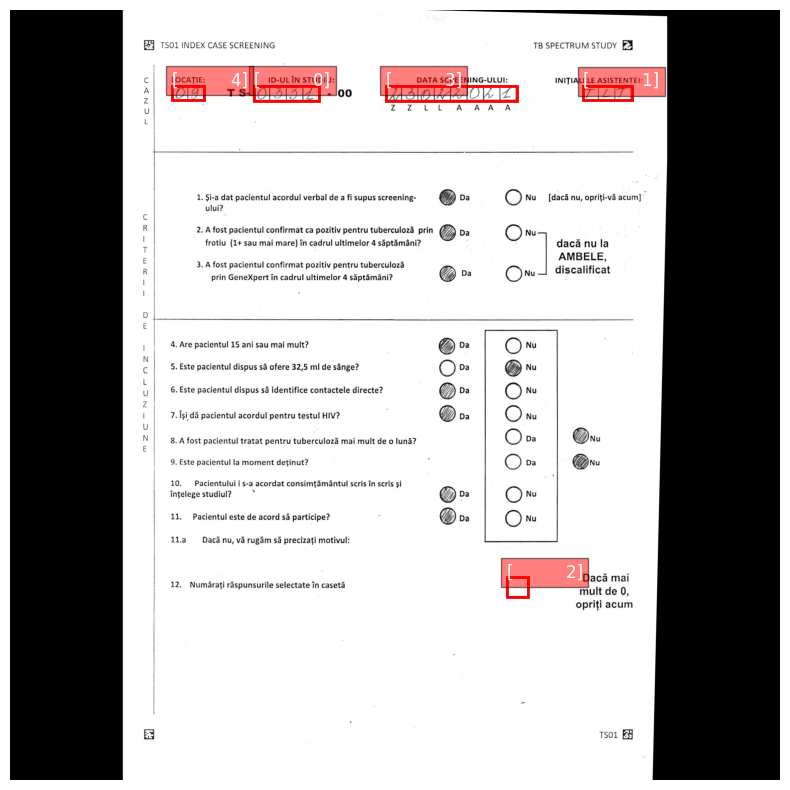

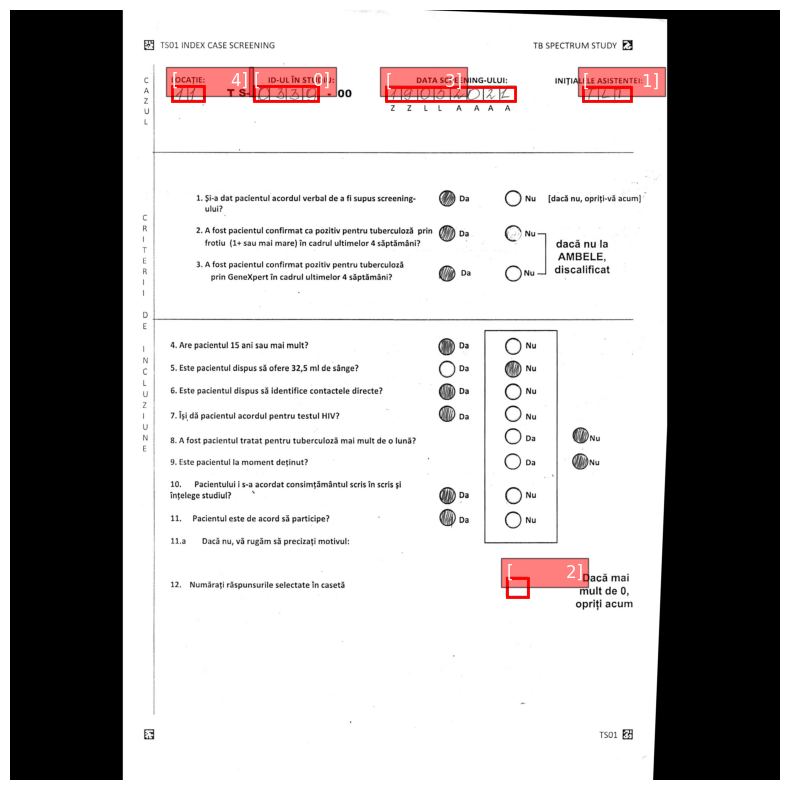

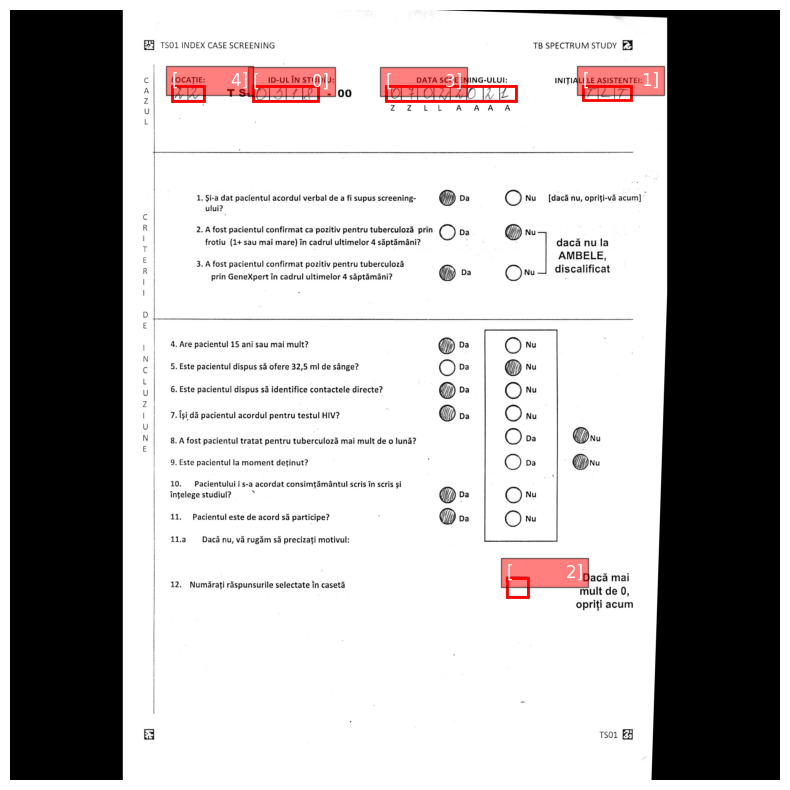

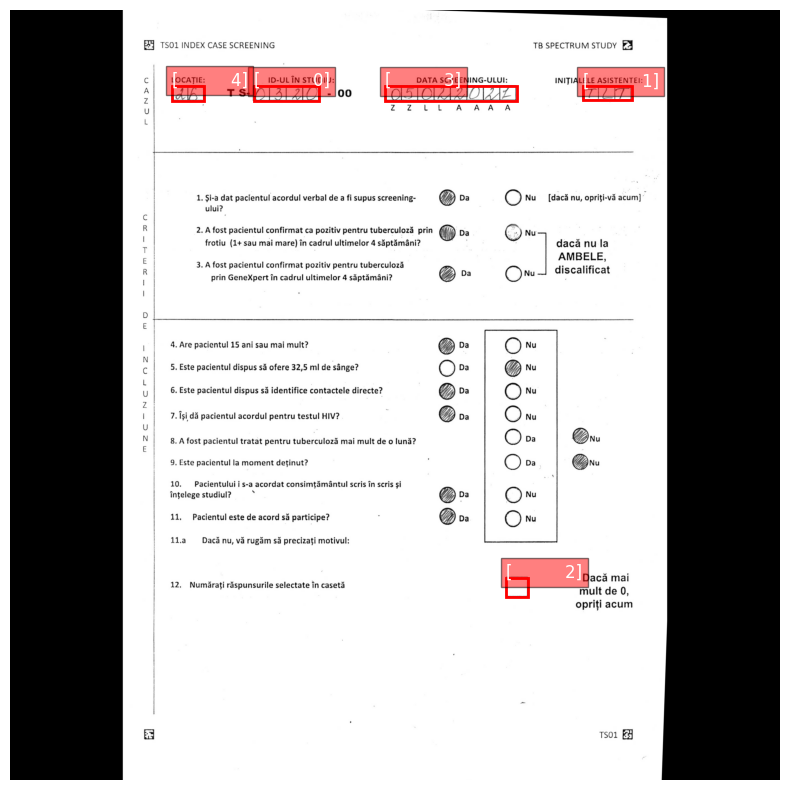

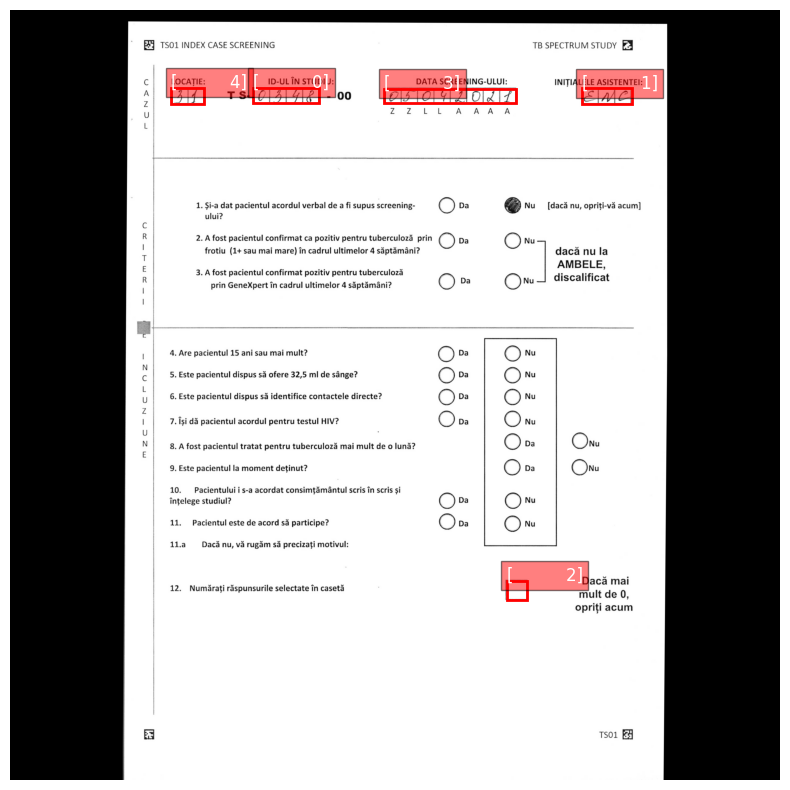

...

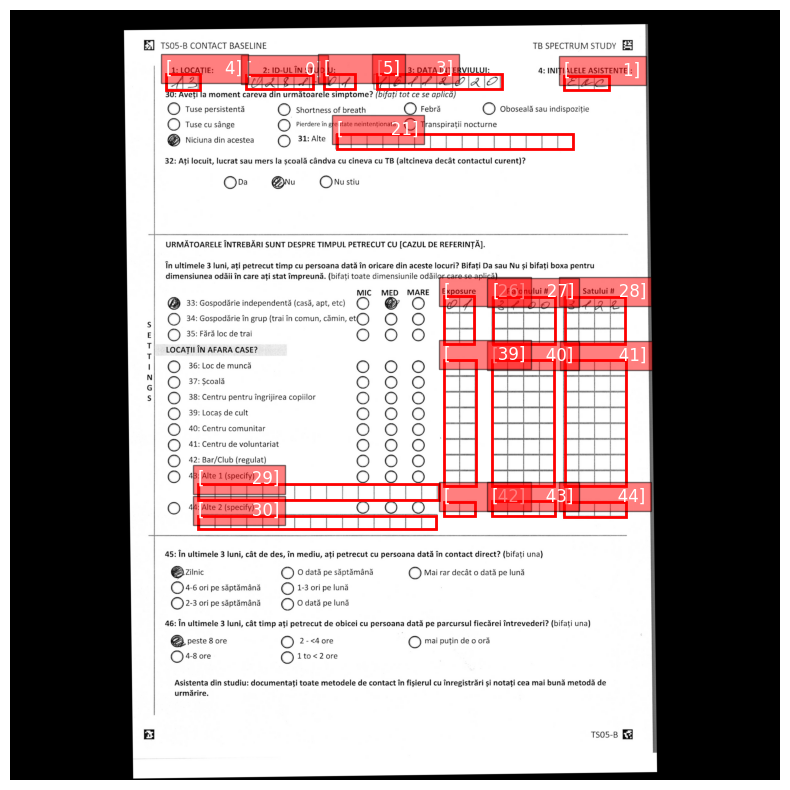

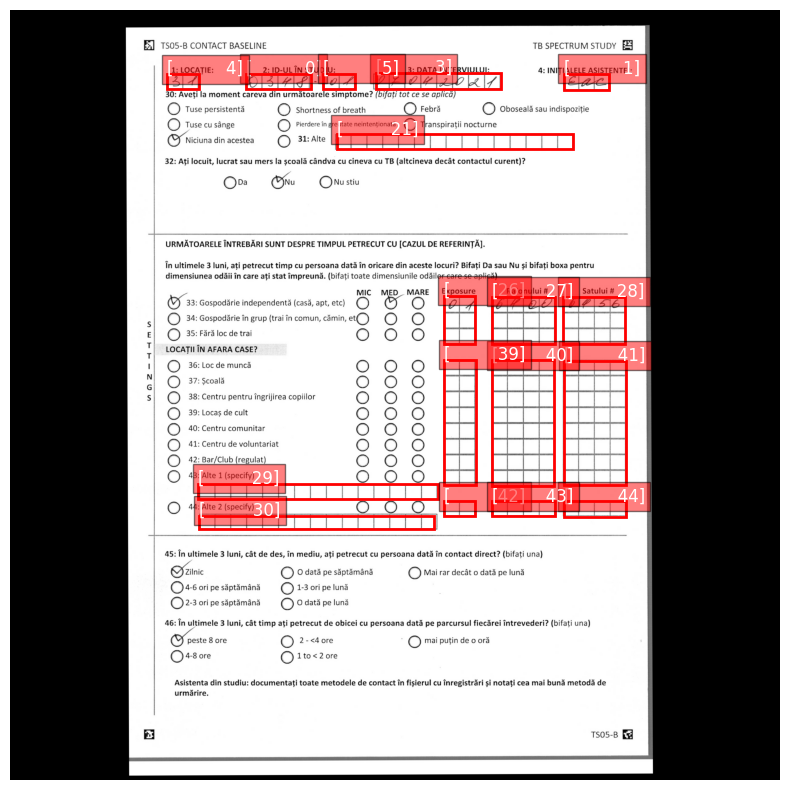

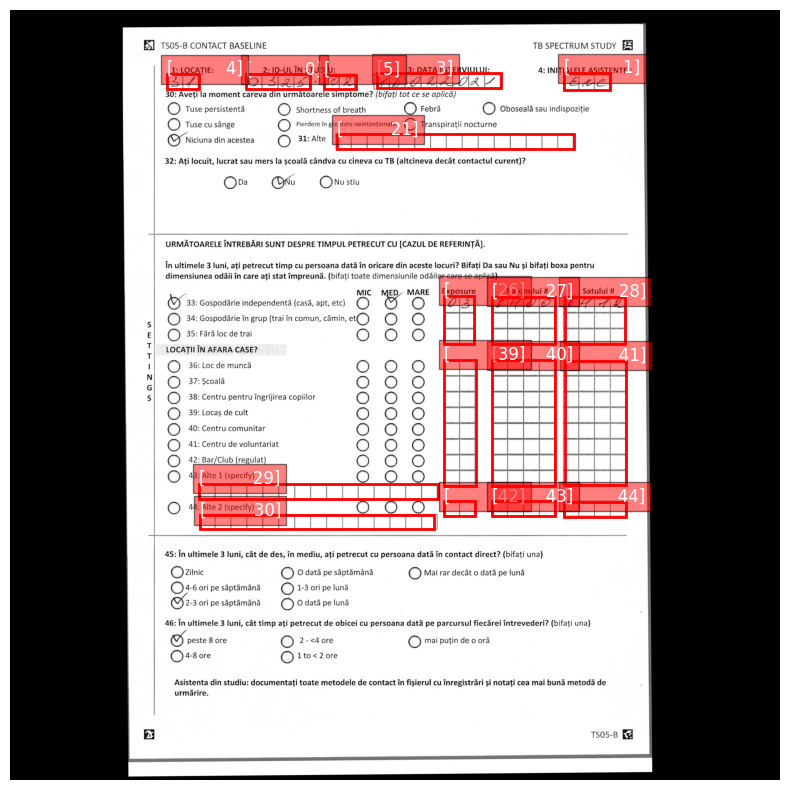

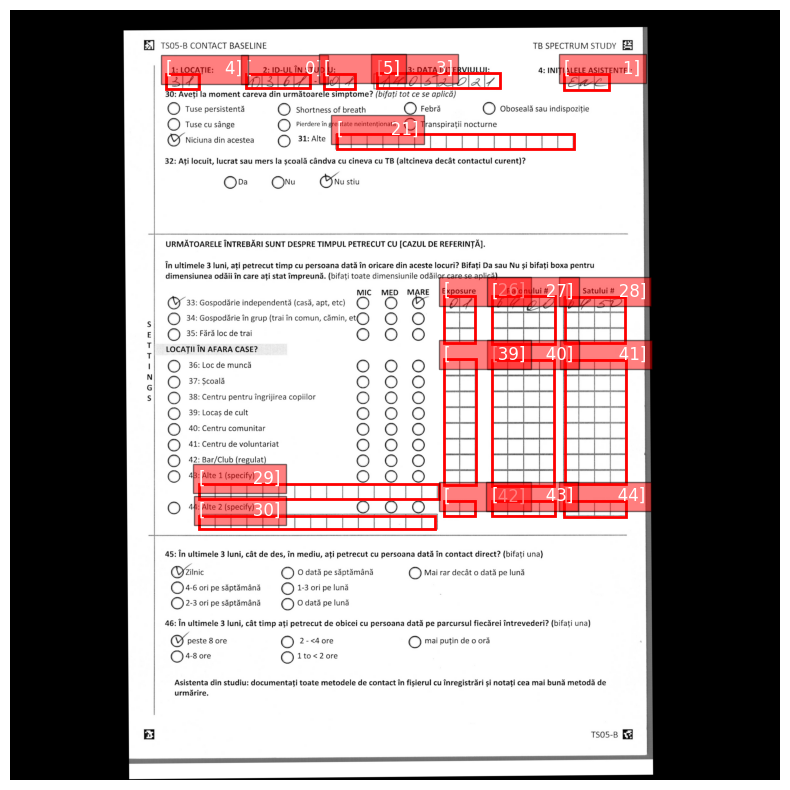

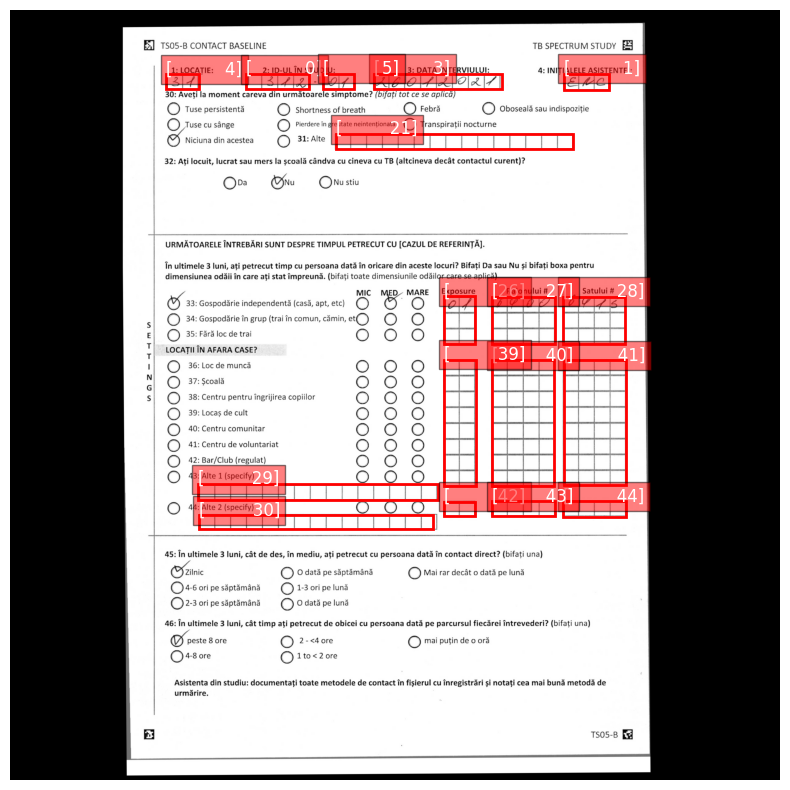

In [11]:
import os
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Manually display images with bounding boxes using matplotlib
for idx, result in enumerate(results):
    # Load the original image
    img_path = image_paths[idx]
    img = cv2.imread(img_path)

    # Convert from BGR (OpenCV) to RGB for matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Plot the image with matplotlib
    plt.figure(figsize=(10, 10))
    plt.imshow(img_rgb)
    plt.axis('off')

    # Plot bounding boxes
    for box in result.boxes:  # Assuming 'result.boxes' has the bounding boxes
        # Extract the bounding box (x1, y1, x2, y2) and move to CPU
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()  # Convert to numpy array
        label = box.cls.cpu().numpy()  # class label as numpy array

        # Draw rectangle (Bounding box)
        plt.gca().add_patch(plt.Rectangle(
            (x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor='red', linewidth=2))

        # Add class label text (optional)
        plt.text(x1, y1, f"{label}", color="white", fontsize=5,
                 bbox=dict(facecolor='blue', alpha=0.5))

    # Show the image with bounding boxes
    plt.show()

In [17]:
import os
import cv2

# Directory where you want to save the images with bounding boxes
output_dir = '/content/drive/MyDrive/yolo_train/output'
os.makedirs(output_dir, exist_ok=True)  # Create directory if it doesn't exist

# Define font and color for drawing the bounding boxes and text
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 0.9
font_thickness = 1
box_color = (0, 0, 255)  # Red bounding box
text_color = (255, 0, 0)  # blue text

# Manually process and save images with bounding boxes
for idx, result in enumerate(results):
    # Load the original image
    img_path = image_paths[idx]
    img = cv2.imread(img_path)

    # Plot bounding boxes
    for box in result.boxes:
        # Extract the bounding box (x1, y1, x2, y2) and move to CPU
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)  # Convert to integer
        label = int(box.cls.cpu().numpy()[0])  # Convert class label to integer

        # Draw the rectangle (Bounding box)
        cv2.rectangle(img, (x1, y1), (x2, y2), box_color, 2)  # 2 = thickness of the box

        # Put the class label text on the image (optional)
        label_text = f"Class: {label}"
        cv2.putText(img, label_text, (x1, y1 - 10), font, font_scale, text_color, font_thickness, lineType=cv2.LINE_AA)

    # Save the image with bounding boxes
    output_image_path = os.path.join(output_dir, f"result_{idx}.png")
    cv2.imwrite(output_image_path, img)


# downloads model weights to local storage

In [12]:
import shutil
from google.colab import files

# Path to the folder you want to download
folder_to_zip = '/content/runs'
output_zip_file = '/content/runs.zip'

# Zip the folder
shutil.make_archive(output_zip_file.replace('.zip', ''), 'zip', folder_to_zip)

# Download the zip file
files.download(output_zip_file)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>